(sec:opencv)=

# OpenCVの基本

OpenCV とは元々 Intel 社が 1999 年から開発を開始した画像処理およびコンピュータビジョン用のライブラリで、2006 年にバージョン 1.0 が公開された。OpenCV は元々 C/C++で開発されていたが、現在の最新バージョンである 4.x 系はPythonを含む非常に多くの言語でラッパーが公開されている。

OpenCV で行える計算は画像の読み書きや、単純な画像フィルタの他、画像からの三次元復元や機械学習など幅広いが、ここでは基本的な機能に絞って解説する。

In [ ]:
"""
下準備のコード
"""

import seaborn as sns

rc = {'figure.dpi': 150}
sns.set_theme(style='white', palette='colorblind', rc=rc)

## 画像の読み書き

まずは講義の[GitHub](https://github.com/tatsy-classes/1284-sds-advml/tree/master/data)にアクセスして、3 枚ある画像から好きなものを一つダウンロードしよう。その画像 (以下は`sunflower.jpg`とする)を IPython を起動しているディレクトリと同じディレクトリに配置して、画像を読み込んでみよう。

なお、Jupyter Lab 等で現在の作業ディレクトリが分からなくなった場合には、

```python
import os

os.getcwd()
```

で現在のパスを調べることができるので、そこからの画像の相対パスを指定しよう。

ただ、このような混乱が起こらないように、**講義用の作業用ディレクトリを作っておくことをおすすめする**。

### 画像の読み込み

さて、画像の用意ができたら、以下のコードを実行して、画像を読み込んでみる。

画像の読み込みには`cv2.imread`関数を用いる。第一引数にはファイル名、第二引数にはデータをどのような形式で読み込みかを指定する。例えば`cv2.IMREAD_COLOR`を指定するとRGB形式で色が表されたカラー画像として読み込まれ、`cv2.IMREAD_GRAYSCALE`なら、指定したファイルがカラーか否かに関係なく、グレースケール画像としてファイルが読み込まれる。

In [ ]:
import cv2
import numpy as np

# 画像のパスは適宜読み替えること
filename = 'sunflower.jpg'
img = cv2.imread(filename, cv2.IMREAD_COLOR)

# 読み込みの成否を確認
if img is None:
    raise OSError(f'Failed to load image: {filename:s}')

`cv2.imread`関数は、画像の読み込みに失敗すると`img`が`None`となるので、上記のコードに倣ってエラーチェックを入れておくと、些細な間違いを防ぐことができる。

画像が読み込めたら`shape`メソッドで大きさを確認してみましょう。正しく読み込めていれば、サイズは 2048x1360 となっているはずだ。

ただし、**OpenCV は画像の大きさを「高さ」×「幅」で表現している**ため、高さが最初に来ること、そしてカラー画像として読み込んでいるので、赤・緑・青の色の強さを表わすチャネル数である 3 が末尾に追加されて以下のように出力される。

In [ ]:
print(f'Image shape is {img.shape}')

Image shape is (1360, 2048, 3)


次に、ここで読みこんだ画像を Matplotlib を使って確認してみよう。画像の表示には`plt.imshow`を使う。

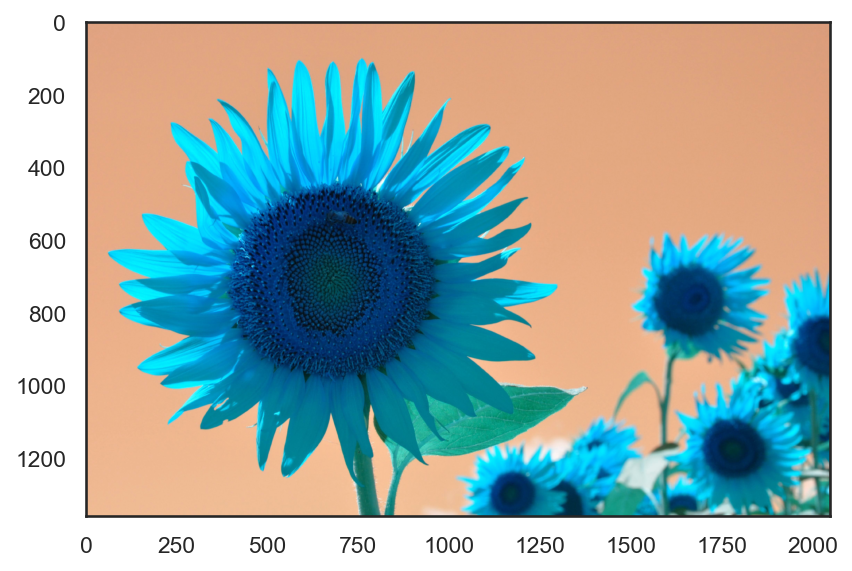

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(img)
plt.show()

ご覧の通り、色合いがおかしな画像になっていることが分かる。これは、OpenCV でカラー画像を読み込むと色を表わす 3 チャネルが赤・緑・青 (RGB)の順番ではなく青・緑・赤 (BGR)の逆順になっているためで、これを直すには以下のように色表現を変更する必要がある。

In [ ]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

この処理を加えた後、同様に`plt.imshow`を用いて画像を表示してみると、以下のような正しい出力が得られる。なお、単に画像を表示したい時は軸が余計に感じられるので、その場合は`plt.axis("off")`あるいは`plt.xticks([])`、`plt.yticks([])`を呼び出すとよい。

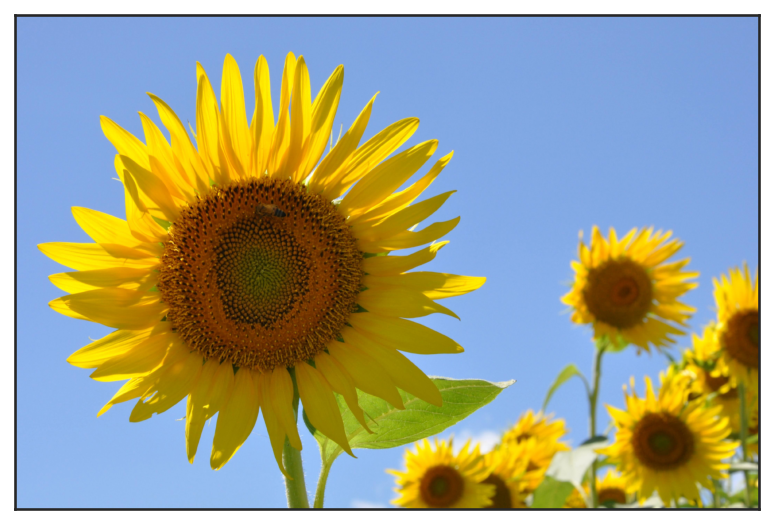

In [ ]:
plt.imshow(img)
plt.xticks([])
plt.yticks([])
plt.show()

::::{admonition} 練習問題
:class: question

`cv2.imread`の第2引数に`cv2.IMREAD_GRAYSCALE`を指定して、読み込まれた画像の`shape`を確認し、`plt.imshow`で表示して、その内容を確認せよ。

::::

### 画像の保存

画像の保存には`cv2.imwrite`関数を用いる。この関数は第 1 引数に画像を保存する先のパスを、第 2 引数に画像を表わす NumPy の多次元配列を取る。

画像の保存に成功すると`True`が、失敗すると`False`が返ってくるので、保存に失敗したときにエラーメッセージを表示するようにしておくと良い。

保存をする際の注意点として、`cv2.imwrite`は JPEG や PNG 等の 8bit 長の色表現を用いる画像形式を保存する際には、**画素の値が 0-255 で表わされている必要**がある。画像処理のために、画素の形式を`float`等に変換する場合には注意すること。

また、カラー画像の場合には読み込み時と同様に**B, G, R の順で色成分が保存されている必要がある**ので、この点にも注意すること。

In [ ]:
outname = 'copy.jpg'
img_rgb = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
succ = cv2.imwrite(outname, img_rgb)
if not succ:
    raise OSError(f'Failed to save image file: {outname:s}')

::::{admonition} 練習問題
:class: question

画像の圧縮方式には様々なものがあり、JPEG や PNG などが広く知られている。これらの圧縮方式について、非可逆圧縮と可逆圧縮の違いについて、JPEG と PNG に用いられる圧縮アルゴリズムを例にとって説明せよ。
::::

::::{admonition} 画像の色表現
:class: tip

上記のプログラムでは OpenCV を用いてカラー画像を読み込んだが、各画素の色は赤・緑・青の三要素を用いて表わされていた。これは、**光の三原色と呼ばれる色で、人間の目が捉える様々な波長の光のうち、特徴的な三つの成分を取りだして表現している** (厳密には各波長の感度には幅がある)。デジタル画像の表現形式は、この光の三原色を基本とした RGB 表色に従っていることが一般的である (例えば JPEG や PNG など)。

光の三原色は色を混ぜると白に近づくことで、例えば RGB の各値が一般的なデジタル画像における最大値である(255, 255, 255)を取ると、それは白色に対応する。このような**色の重ね合わせで明るくなっていく表色系のことを加法混色系**という。逆に、絵の具を混ぜた時のように、**色を重ねるごとに黒に近づいていく表色系のことを減法混色系**という。

デジタル画像の保存に RGB 形式が広く用いられる一方で、実際の応用に画像(や動画)を用いる際には、別の表色系が好まれることがある。例えば、**テレビ映像を伝送する際には、帯域を削減する目的で YUV や YCbCr といった異なる表色が用いられる**。また、プリンタに対して色情報を送るときには加法混色に従う RGB 表色系ではなく、**プリンタのインクが従う減法混色系の一種である CMYK 表色系** (C=シアン、M=マゼンタ、Y=イエロー、K=キープレート=黒)が用いられるのが一般的である。
::::

(ssec:image-transformation)=

## 画像に対する幾何学的操作

### 画像の拡大・縮小

画像の拡大・縮小には`cv2.resize`関数を使う。この関数は

In [ ]:
img_small = cv2.resize(img, (1024, 680))

のように、拡大縮小後のサイズを指定する方法と

In [ ]:
img_small = cv2.resize(img, None, fx=0.5, fy=0.5)

のように拡大・縮小の倍率を指定する 2 つの方法がある。

また、画像を拡大・縮小するときには拡大・縮小後の各画素の色を決定する方法としていくつかの方法があり、これを信号処理の用語ではリサンプリングと呼ぶ。

最も一般的な方式はバイリニア補間と呼ばれる方式で、これは周囲の 4 つの画素を x 方向と y 方向の 2 方向で線形補間 (リニア補間)する方法である。これ以外にも、単純に最も近い画素の値を用いるニアレスト補間や、より多くの周囲の画素の並びから色を決定するバイキュービック補間などが広く用いられている。

In [ ]:
img_nearest = cv2.resize(img, (1024, 680), interpolation=cv2.INTER_NEAREST)  # ニアレスト補間
img_bilinear = cv2.resize(img, (1024, 680), interpolation=cv2.INTER_LINEAR)  # バイリニア補間
img_bicubic = cv2.resize(img, (1024, 680), interpolation=cv2.INTER_CUBIC)  # バイキュービック補間

なお、**極端に画像を小さくする**ときには、バイリニア補完等よりも、1 画素に縮退する画素値の重み付き平均を用いる`INTER_AREA`オプションが非常に良く働く。なお`INTER_AREA`オプションは画像を拡大するときには`INTER_NEAREST`と変わらないので注意。

In [ ]:
img_bilinear = cv2.resize(img, (128, 85), interpolation=cv2.INTER_LINEAR)  # ニアレスト補間
img_bicubic = cv2.resize(img, (128, 85), interpolation=cv2.INTER_CUBIC)  # バイリニア補間
img_area = cv2.resize(img, (128, 85), interpolation=cv2.INTER_AREA)  # エリア補間

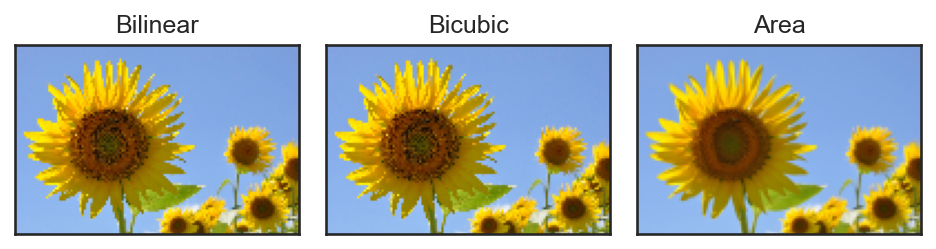

In [ ]:
fig, axs = plt.subplots(1, 3)

ax1 = axs[0]
ax1.imshow(img_bilinear)
ax1.set(xticks=[], yticks=[])
ax1.set_title('Bilinear')

ax2 = axs[1]
ax2.imshow(img_bicubic)
ax2.set(xticks=[], yticks=[])
ax2.set_title('Bicubic')

ax3 = axs[2]
ax3.imshow(img_area)
ax3.set(xticks=[], yticks=[])
ax3.set_title('Area')

plt.tight_layout()
plt.show()

### 画像の回転

画像を回転される方法は 90 度刻みでの回転に使える`cv2.rotate`と、より細かな回転(+幾何的な変形)に対応できる`cv2.warpAffine`を使う方法の二通りがある。

まず`cv2.rotate`を使う場合だが、この関数は第一引数に回転させる画像を、第 2 引数に回転の量を表わすフラグとして以下のいずれかを取る。

- `cv2.ROTATE_90_CLOCKWISE` - 時計回りに 90° 回転
- `cv2.ROTATE_90_COUNTERCLOCKWISE` - 反時計回りに 90° 回転
- `cv2.ROTATE_180` - 180° 回転 (回転方向に依らず結果は同じ)

一例として、反時計回りに 90° 回転させてみる。

In [ ]:
img_rot = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)

すると、以下のような画像が得られる。

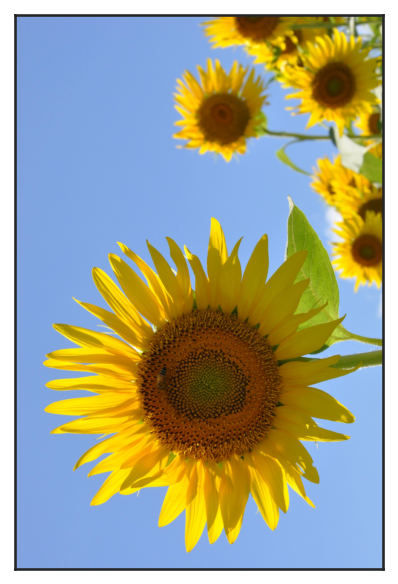

In [ ]:
fig, ax = plt.subplots()
ax.imshow(img_rot)
ax.set(xticks=[], yticks=[])
plt.show()

続いて`cv2.warpAffine`を用いる方法だが、この関数は名前の通り、アフィン変換に基づいて画像を変形する関数だ。ここでは、アフィン変換について詳細に解説することは避けるが、アフィン変換は 2x3 の行列を使って、画素の座標を変換することで画像のリサンプリングを行う。

2x3 の行列は一般には、
\begin{equation*}
\begin{pmatrix}
a & b & c \\
d & e & f
\end{pmatrix}
\end{equation*}
のように表わされるが、アフィン変換では左側の 2x2 の成分(a, b, d, e を成分に持つ箇所)が回転や拡大縮小などの成分、右側の 2x1 の成分(c, f を成分に持つ箇所)が平行移動量を表わす。

一例として、反時計回りに 90° 回転させたいのであれば、それに相当するアフィン変換の行列は「画像の中心を回転中心」として「反時計回りに 90°」回転させる操作を表わすものである必要がある。このような行列は

1. 画像の中心を原点に移動する平行移動
1. 原点を中心として反時計回りに 90° 回転
1. 原点にある画像の中心を元の位置に戻すための平行移動
   という 3 つの基本操作を組み合わせる必要がある。

ここでは、上記の三つの操作に対応する行列をそれぞれ$M_1$, $M_2$, $M_3$とすることにしよう。すると、そのそれぞれは以下のように表せる。

$$
\begin{align}
M_1 &= \begin{pmatrix}
  1 & 0 & - W / 2 \\
  0 & 1 & - H / 2
\end{pmatrix}, \\
M_2 &= \begin{pmatrix}
  \cos (-90^\circ) & -\sin (-90^\circ) & 0 \\
  \sin (-90^\circ) & \cos (-90^\circ) & 0
\end{pmatrix}, \\
M_3 &= \begin{pmatrix}
  1 & 0 & W / 2 \\
  0 & 1 & H / 2
\end{pmatrix}
\end{align}
$$

のようになる。一般に上記のような回転行列の表現は x 軸が右向き正、y 軸が上向き正の時には反時計回りの回転を表わすのだが、**画像の座標系は y 軸下向きが正に取られている**ため、時計回りが回転方向正になることに注意してほしい。

そこで、これらの行列と`cv2.warpAffine`を使って画像を回転してみる。なお、上記のアフィン変換(2x3 行列)の合成変換を求めるために、各変換を 3x3 の行列として定義していることに注意すること。

In [ ]:
H, W, _ = img.shape
M1 = np.array([[1.0, 0.0, -W / 2], [0.0, 1.0, -H / 2], [0.0, 0.0, 1.0]])
M2 = np.array(
    [
        [np.cos(-0.5 * np.pi), -np.sin(-0.5 * np.pi), 0.0],
        [np.sin(-0.5 * np.pi), np.cos(-0.5 * np.pi), 0.0],
        [0.0, 0.0, 1.0],
    ]
)
M3 = np.array([[1.0, 0.0, W / 2], [0.0, 1.0, H / 2], [0.0, 0.0, 1.0]])

M = M3 @ M2 @ M1
img_rot = cv2.warpAffine(img, M[:2, :], (W, H))

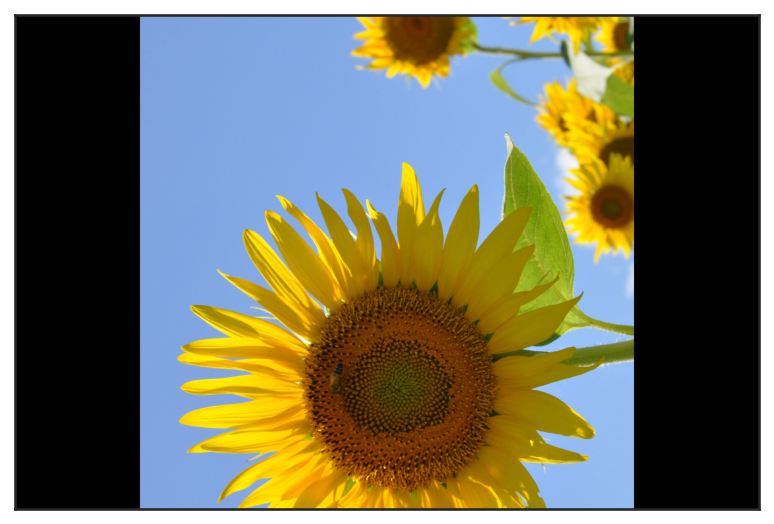

In [ ]:
fig, ax = plt.subplots()
ax.imshow(img_rot)
ax.set(xticks=[], yticks=[])
plt.show()

`cv2.warpAffine`は画像領域自体は変形しないため、`cv2.rotate`とは違い両端に黒い領域が現れてしまっているが、回転のされ方としては正しい回転となっていることが分かる。

なお、ここまでアフィン変換の仕組みを説明するために回りくどい方法を用いたが、OpenCV には画像を回転させる行列を得るための関数として`cv2.getRotationMatrix2D`が用意されており、上記のプログラムと同じ出力なら以下のように得られる。

In [ ]:
H, W, _ = img.shape
M = cv2.getRotationMatrix2D(center=(W / 2, H / 2), angle=90, scale=1.0)
img_rot = cv2.warpAffine(img, M, (W, H))

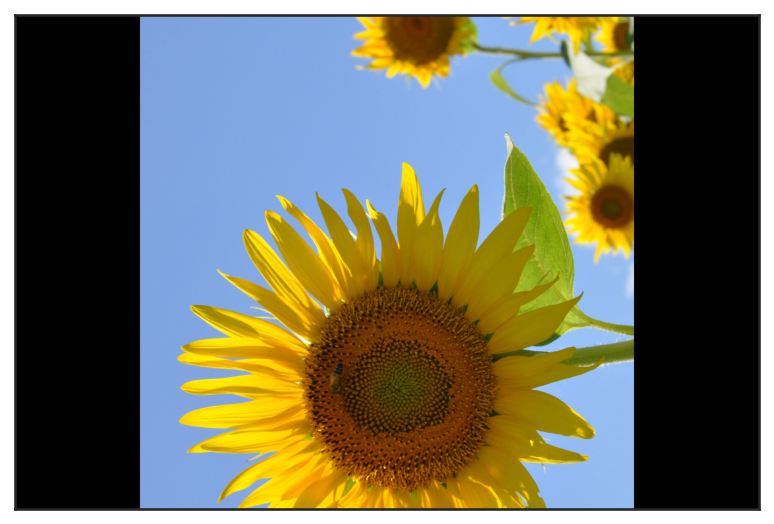

In [ ]:
fig, ax = plt.subplots()
ax.imshow(img_rot)
ax.set(xticks=[], yticks=[])
plt.show()

### 画像の反転

画像の反転を行う方法にも `cv2.flip` を用いる方法と `cv2.warpAffine` を用いる方法の二種類がある。それぞれ見ていこう。

`cv2.flip`を用いる場合は、第 1 引数に画像を、第 2 引数に反転の種類を表わす数字を入力する。この数字(`flipcode`)は 0、正、負の三種類で挙動が変わるようになっており、

- 0: 上下方向(X 軸を中心に)に反転
- 正: 左右方向(Y 軸を中心に)に反転
- 負: 縦横両方の反転
  に対応している。

In [ ]:
img_flip_x = cv2.flip(img, 0)  # 上下反転
img_flip_y = cv2.flip(img, 1)  # 左右反転
img_flip_both = cv2.flip(img, -1)  # 上下左右反転

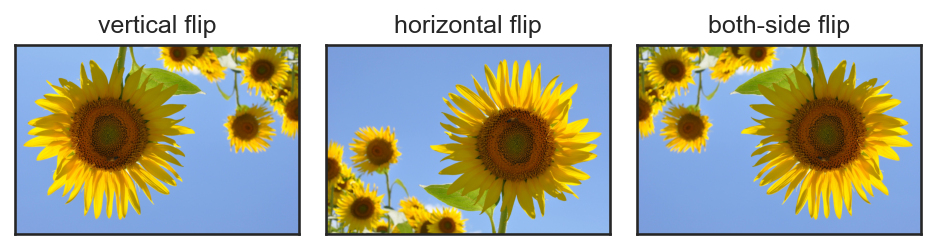

In [ ]:
fig, axs = plt.subplots(1, 3)

# 上下反転
ax = axs[0]
ax.imshow(img_flip_x)
ax.set_title('vertical flip')
ax.set(xticks=[], yticks=[])

# 左右反転
ax = axs[1]
ax.imshow(img_flip_y)
ax.set_title('horizontal flip')
ax.set(xticks=[], yticks=[])

# 上下左右反転
ax = axs[2]
ax.imshow(img_flip_both)
ax.set_title('both-side flip')
ax.set(xticks=[], yticks=[])

plt.tight_layout()
plt.show()

また、余談にはなるが、NumPy にも配列の上下左右を入れ替えるメソッドが用意されており、上下反転なら`np.flipud`、左右反転なら `np.fliplr`、左右両方に回転させたい場合には `np.flip` の第 2 引数に縦を縦軸を表わす 0, 横軸を表わす 1 という軸のインデックスを配列として指定すれば良い。

In [ ]:
img_flip_x = np.flipud(img)  # 上下反転
img_flip_y = np.fliplr(img)  # 左右反転
img_flip_both = np.flip(img, axis=[0, 1])  # 上下左右反転

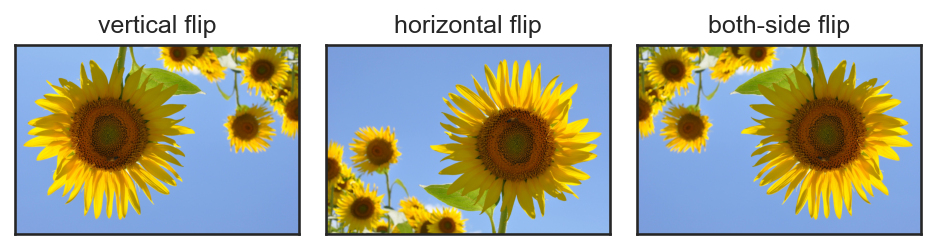

In [ ]:
fig, axs = plt.subplots(1, 3)

# 上下反転
ax = axs[0]
ax.imshow(img_flip_x)
ax.set_title('vertical flip')
ax.set(xticks=[], yticks=[])

# 左右反転
ax = axs[1]
ax.imshow(img_flip_y)
ax.set_title('horizontal flip')
ax.set(xticks=[], yticks=[])

# 上下左右反転
ax = axs[2]
ax.imshow(img_flip_both)
ax.set_title('both-side flip')
ax.set(xticks=[], yticks=[])

plt.tight_layout()
plt.show()

また、最後に `cv2.warpAffine` を用いる方法についてだが、こちらは、X 軸対称、Y 軸対称、X-Y 両軸対称の反転を意味する行列 $M_1$、$M_2$、$M_3$ がそれぞれ

$$
M_1= \begin{pmatrix}
1 & 0 & 0 \\
0 & -1 & H
\end{pmatrix}, \quad
M_2= \begin{pmatrix}
-1 & 0 & W \\
0 & 1 & 0
\end{pmatrix}, \quad
M_3= \begin{pmatrix}
-1 & 0 & W \\
0 & -1 & H
\end{pmatrix}
$$

のように表せることから、以下のようなコードにより、`cv2.flip`等と同様の効果を得ることができる。なお、上記の行列で単に対角成分を`-1`にするだけだと、画像の表示領域から画素がはみ出してしまうため、反転した後に反転した方向の画素数分だけ正の方向に平行移動する成分が第 3 列に入っていることに注意してほしい。

In [ ]:
H, W = img.shape[:2]

# 上下反転
M_1 = np.array([[1, 0, 0], [0, -1, H]], dtype='float32')
img_flip_x = cv2.warpAffine(img, M_1, (W, H))

# 左右反転
M_2 = np.array([[-1, 0, W], [0, 1, 0]], dtype='float32')
img_flip_y = cv2.warpAffine(img, M_2, (W, H))

# 上下左右反転
M_3 = np.array([[-1, 0, W], [0, -1, H]], dtype='float32')
img_flip_both = cv2.warpAffine(img, M_3, (W, H))

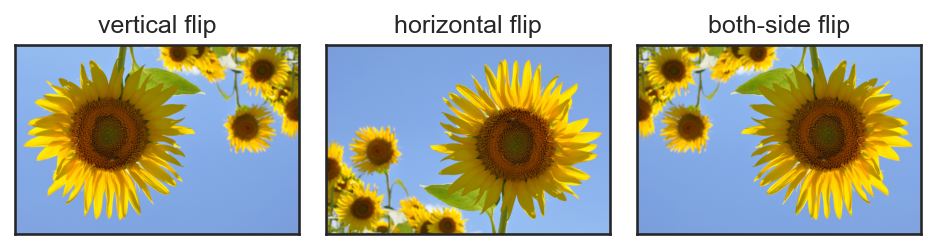

In [ ]:
fig, axs = plt.subplots(1, 3)

# 上下反転
ax = axs[0]
ax.imshow(img_flip_x)
ax.set_title('vertical flip')
ax.set(xticks=[], yticks=[])

# 左右反転
ax = axs[1]
ax.imshow(img_flip_y)
ax.set_title('horizontal flip')
ax.set(xticks=[], yticks=[])

# 上下左右反転
ax = axs[2]
ax.imshow(img_flip_both)
ax.set_title('both-side flip')
ax.set(xticks=[], yticks=[])

plt.tight_layout()
plt.show()

::::{admonition} 問題
:class: question

本項で述べた画像の幾何変換における画像補間の方式について、バイリニア補間、バイキュービック補間は、それぞれ1次式、3次式による画素値の補間である。これらの補間に用いられる1次式、3次式はどのようなものであるか。
::::

## 画像フィルタ

画像のフィルタ処理には、目的に応じて多くの種類があるが、ここでは、**ぼかしフィルタ** (ノイズ除去フィルタ)と、**エッジ検出フィルタ**について紹介する。

この際、「フィルタ」というのは、とある「フィルタカーネル」関数と、二次元画像の畳み込み演算であることに留意してほしい。具体的には、画像を位置 $(x, y)$の関数として $I(x, y)$と表わし、フィルタカーネルを$f(x, y)$のように表わすとすれば、フィルタ処理は、畳み込み演算として

$$
\iint I(x + \xi, y + \eta) f(\xi, \eta) {\rm d}\xi {\rm d}\eta
$$ (eq:filter-convolution)

のように書けることを覚えておいてほしい。

### ぼかしフィルタ

ぼかしフィルタの目的は、画像に含まれている高周波のノイズを除去することにある。最初に、先ほど読み込んだ画像に対して、正規分布に従うノイズを付与してみる。

なお、以下のコードでは、輝度成分だけにノイズがのるように、RGB の各要素に対して同じ量のノイズを付加していることに注意せよ。

In [ ]:
img_noisy = cv2.resize(img, None, fx=0.1, fy=0.1, interpolation=cv2.INTER_AREA)
img_noisy = (img / 255.0).astype('float32')
noise = np.random.normal(size=img.shape[:2]) * 0.2
img_noisy += noise[:, :, None]
img_noisy = np.clip(img_noisy, 0.0, 1.0)

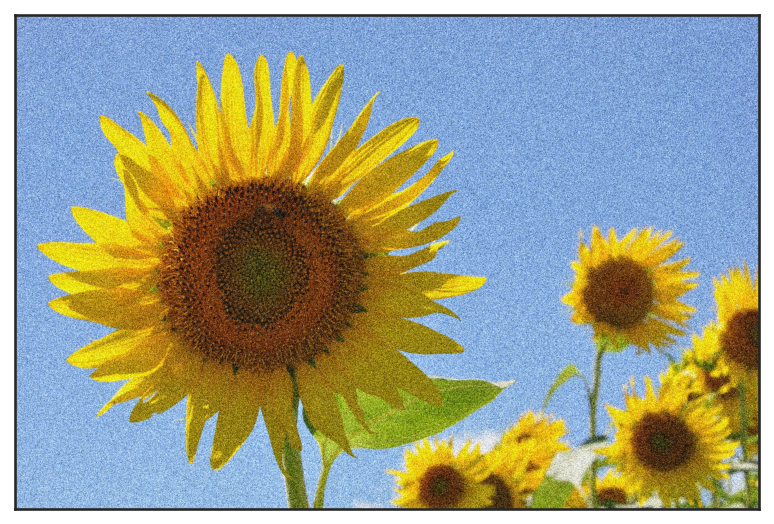

In [ ]:
fig, ax = plt.subplots()
ax.imshow(img_noisy, vmin=0, vmax=1)
ax.set(xticks=[], yticks=[])
plt.show()

ノイズを付与すると、上記のように、元の画像が見分けづらくなる。このようなノイズは、写真を撮るときに被写体が暗い場合に多く生じる。また、ノイズの種類は異なるが、JPEG 等の不可逆圧縮をかけることによっても、ノイズが生じる。

#### Gaussian フィルタ

**Gaussian フィルタ**は、その名前の通り、二次元の Gauss 分布 (正規分布)を画像に畳み込むことで実現される。すなわち、フィルタカーネル$f(x, y)$を次のように定義する。

$$
f(x, y) = \frac{1}{K} \exp\left( -\frac{x^2 + y^2}{2 \sigma^2} \right)
$$

ただし、$K$は、カーネル関数の定義域全体での積分が 1 となるような規格化定数であるとする。定義の通り、Gaussian フィルタのフィルタカーネルは定義域が二次元の実平面全体であるため、これをコンピュータに計算させることはできない。

しかし、Gauss 関数は、原点から遠い$(x, y)$には、ほとんど 0 と見なせる値を取るので、実用的には、有限の範囲についての積分だけを考えれば十分である。そこで、{eq}`eq:filter-convolution`を以下のように離散化する。

$$
\frac{1}{K} \sum_{\xi = -H}^{+H} \sum_{\eta = -H}^H I(x + \xi, y + \eta) f(\xi, \eta)
$$

ただし、$H$は、積分を行う矩形窓の半径を表わしており、規格化定数$K$は、

$$
K = \sum_{\xi = -H}^{+H} \sum_{\eta = -H}^H f(\xi, \eta)
$$

のように定義する。

OpenCV で Gaussian フィルタを実行するには`cv2.GaussianBlur`関数を用いる。この関数は第 1 引数に画像をとり、第 2 引数に積分窓の直径 $2H + 1$を取る。さらに、最後の引数に Gauss 関数のパラメータ$\sigma$を取る。

In [ ]:
img_gauss = cv2.GaussianBlur(img_noisy, (11, 11), 5.0)

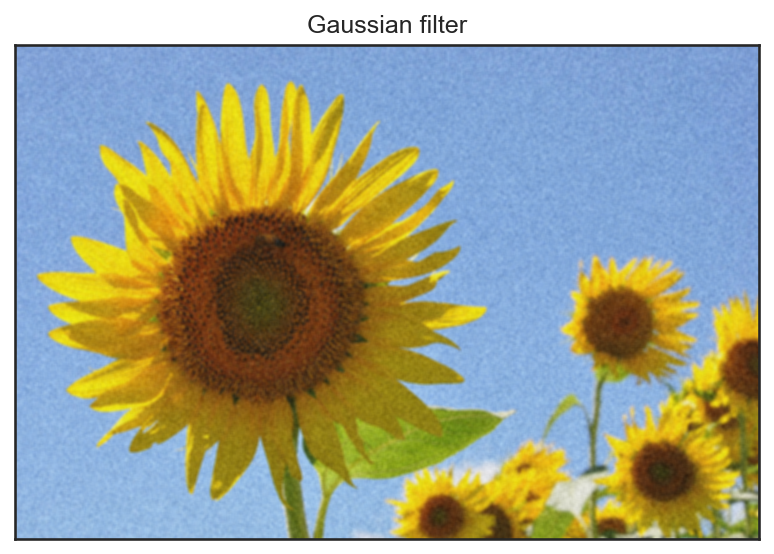

In [ ]:
fig, ax = plt.subplots()
g = ax.imshow(img_gauss, vmin=0, vmax=1)
ax.set(title='Gaussian filter', xticks=[], yticks=[])
plt.show()

このように、Gaussian フィルタにより、高周波のノイズは除けているものの、画像には斑点状ノイズが残ってしまっている。さらに、元のひまわりの画像信号にもぼけが生じており、元の画像を復元できているとは言いがたい。

#### バイラテラルフィルタ

**バイラテラルフィルタ** (bilateral filter)は Tomasi と Manduchi によって 1998 年に提案されたフィルタ{cite}`tomasi1998bilateral`で、Gaussian フィルタが元画像の信号までぼかしてしまう問題を緩和したものである。

具体的には、**色が近い画素同士の間でだけぼかしがかかる**ように Gauss 関数に色を考慮する項を追加している。バイラテラルフィルタのフィルタカーネルは以下のように定義される。

$$
f(x, y, \xi, \eta) = \frac{1}{K} \exp\left(- \frac{(\xi^2 + \eta^2)}{2 \sigma_s^2} \right) \exp\left( -\frac{\| I(x, y) - I(x + \xi, y + \eta)\|^2}{2 \sigma_r^2} \right)
$$

ただし、$\sigma_s$は画素の位置情報に関するぼかしの強さを調整するパラメータ (s は spatial の s)、$\sigma_r$は画像の輝度に関するぼかしの強さを調整するパラメータ (r は range の r)である。このとき、フィルタカーネルは画像の輝度値を参照するため、原点からのずれ $(\xi, \eta)$以外にフィルタ対象の画素の座標 $(x, y)$も取っていることに注意すること。

OpenCV でバイラテラルフィルタを適用するには`cv2.bilateralFilter`を用いる。この関数は第 1 引数に画像、第 2 引数に離散的な積分範囲を表わす矩形窓の直径を取り、`sigmaColor`のパラメータが$\sigma_r$に、`sigmaSpace`のパラメータが$\sigma_s$に対応している。以下にサンプルコードを示す。

In [ ]:
img_bf = cv2.bilateralFilter(img_noisy, 11, sigmaColor=0.5, sigmaSpace=5.0)

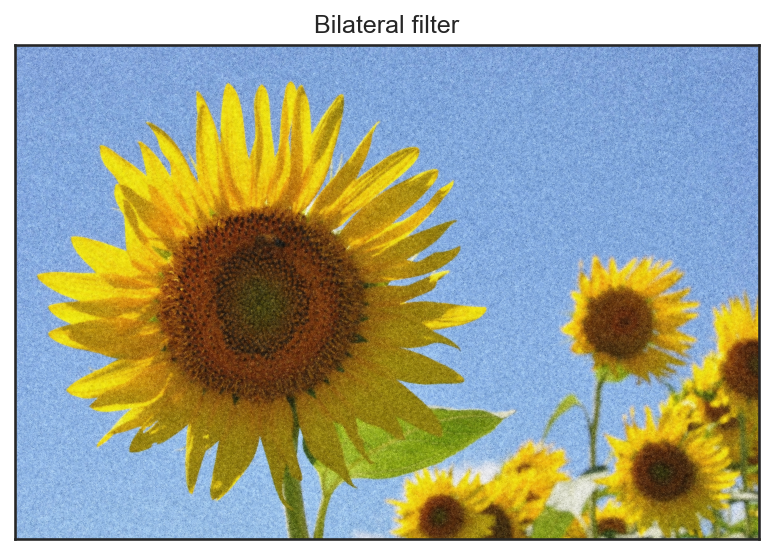

In [ ]:
fig, ax = plt.subplots()
ax.imshow(img_bf, vmin=0, vmax=1)
ax.set(title='Bilateral filter', xticks=[], yticks=[])
plt.show()

このように、Gaussian フィルタと比べると、元の信号のぼけが少なく、また高周波のノイズも低減できていることが分かる。バイラテラルフィルタは繰り返し書けることで、その効果を調整することができる。一例として弱いバイラテラルフィルタを 10 回程度適用すると、以下のような画像が得られる。

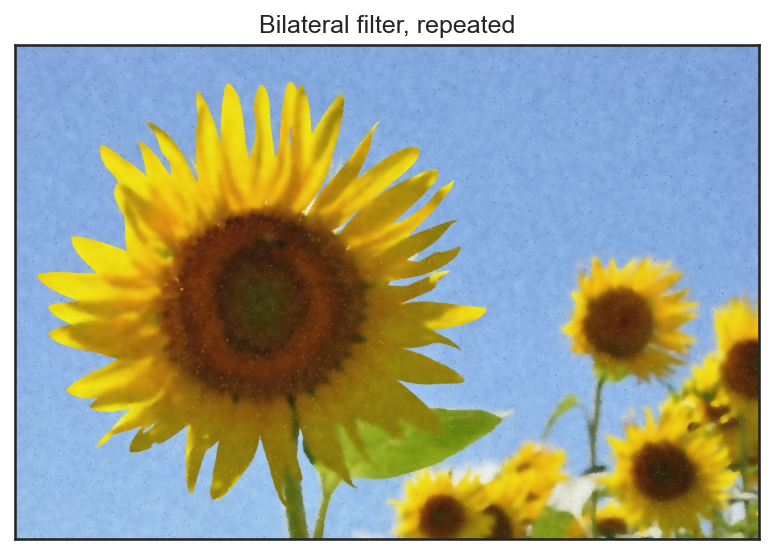

In [ ]:
img_bf_rep = img_noisy.copy()
for i in range(10):
    img_bf_rep = cv2.bilateralFilter(img_bf_rep, 11, sigmaColor=0.25, sigmaSpace=5.0)

fig, ax = plt.subplots()
ax.imshow(img_bf_rep, vmin=0, vmax=1)
ax.set(title='Bilateral filter, repeated', xticks=[], yticks=[])
plt.show()

このように、若干ではあるが、ノイズが低減され、元の画像に近い信号が得られているように見える。

#### メディアンフィルタ

メディアンフィルタは Gaussian フィルタやバイラテラルフィルタとは違い、フィルタカーネルに依らないフィルタである。具体的には、とある画素 $(x, y)$の近傍にある画素を集めてきて、その画素の中間値をフィルタ後の画素値とする、というものである。メディアンフィルタは、ソルトノイズと呼ばれる、所々に外れた輝度値が現れるような画像に高い効果を発揮することが知られている。

OpenCV の`cv2.medianBlur`は 8bit 符号なし整数の画像にしか適用できないので、画像の`dtype`を変更後に適用すること。

In [ ]:
img_med = cv2.medianBlur((img_noisy * 255.0).astype('uint8'), ksize=9)

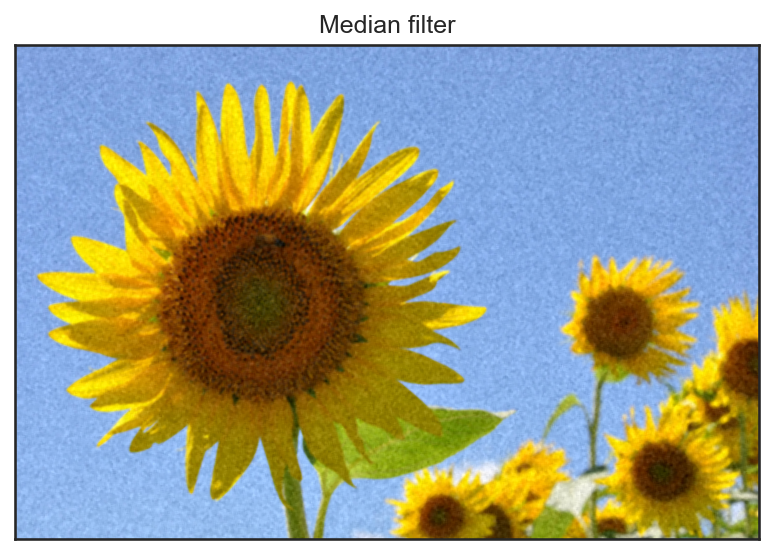

In [ ]:
fig, ax = plt.subplots()
ax.imshow(img_med, vmin=0, vmax=1)
ax.set(title='Median filter', xticks=[], yticks=[])
plt.show()

結果から分かる通り、メディアンフィルタは適度に元画像の信号を保ちつつ、目立ったノイズを低減できていることが分かる。さらに、Gaussian フィルタやバイラテラルフィルタは周辺画素との畳み込みによって、どうしても画素の値が灰色に近づいてしまい、コントラストが落ちるが、メディアンフィルタはノイズ画像に現れる輝度値を再利用しているだけなので、コントラストの落ち方が緩やかである。

ただし、上記の例のように画像全体にくまなくノイズが存在するような場合には、どうしても斑点状のノイズが発生してしまうことは防げない。

:::{admonition} Futher Reading: ぼかしフィルタ
:class: note

上記の通り、単純なぼかしフィルタのノイズ除去性能には限界があり、ノイズレベルによっては、完全にノイズを取り去ることは難しい。ノイズ除去は、非常に古くから研究されているにも関わらず、現在でも多くの手法が提案されている。

比較的性能が良い手法として広く知られている手法には BM3D (Block Matching 3D) {cite}`dabov2007image`があり、この手法は、注目画素の周辺を含む画像断片と類似した断片を画像全体から探してきて、その画像断片の集合を三次元的に処理することでフィルタを実現する手法である。

また、画像フィルタを最適化問題として定式化する手法も多く提案されており、全変動 (total variation)を最小化する手法{cite}`rudin1992nonlinear`や、画素の勾配の$L_0$ノルムを最小化する手法{cite}`xu2011image`などがある。

これ以外にも、近年、ノイズ付きの画像 1 枚「だけ」を深層学習することでノイズ除去を実現する Deep Image Prior 法{cite}`ulyanov2020deep`や、ノイズ付き画像を大量に学習してノイズ除去を実現する Noise2Noise 法{cite}`lehtinen2018noise2noise`などが提案されている。
:::

(edge-detection)=

### エッジ検出フィルタ

エッジは、画像に写っている物体の形を判別する上で重要な情報源である。実際、人間の視覚系においては、第一視覚野 (V1)と呼ばれる箇所において、目から入ってきた信号について、輪郭線の傾きに強く反応することが知られている。従って、エッジの情報は物体認識においても重要な役割を果たす (詳細は[特徴抽出](sec:feature-extraction)にて解説する)。

ここでは、代表的なエッジ検出フィルタとして Sobel フィルタと Canny フィルタについて紹介する。

#### Sobel フィルタ

エッジ(= 輪郭線)とは、物体の境界に現れる曲線であり、通常、物体の境界においては、画像の輝度が大きく変化していると考えられる。その意味で、**エッジとは単純には画像の勾配**であり、その勾配をいかにして良いエッジ情報に変換するかが大事になる。

Sobel フィルタはとある方向について、画像の勾配を取るときに、その垂直方向にぼかしのフィルタを同時にかけることで、ノイズの影響を減らしつつ、エッジを抽出することを目指している。最も単純な 3x3 のフィルタカーネルで表わされる Sobel フィルタ (x 方向の例を示す)は以下のようになる。

In [ ]:
def draw_frame(problem, fig, ax):
    mask = np.zeros_like(problem)
    frame = []
    ax.set_xticks(np.arange(0, 9))
    ax.set_yticks(np.arange(0, 9))
    ax.set_xticklabels(np.arange(1, 10))
    ax.set_yticklabels(np.arange(1, 10))

    ax.set_xticks(np.arange(1, 10) - 0.5, minor=True)
    ax.set_yticks(np.arange(1, 10) - 0.5, minor=True)
    ax.set_xticks([])
    ax.set_yticks([])

    ims = plt.imshow(mask * 0.2, cmap='Blues', vmin=0.0, vmax=1.0)
    frame.append(ims)
    for (i, j), z in np.ndenumerate(problem):
        txt = ax.text(
            j,
            i,
            f'{z:d}',
            ha='center',
            va='center',
            color='k',
            fontsize=15,
        )
        frame.append(txt)

    ax.grid(which='minor', color='k', linestyle='-', linewidth=0.5)
    ax.grid(which='major', color='k', linestyle='-', linewidth=1.0)

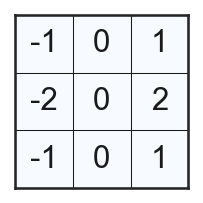

In [ ]:
m = cv2.getDerivKernels(1, 0, 3)
m = np.outer(m[0], m[1]).astype('int32').T
fig, ax = plt.subplots(figsize=(1.5, 1.5))
draw_frame(m, fig, ax)
plt.show()

このカーネルは横方向には画素値の中心差分を取っており、縦方向は、Gaussian フィルタのような中央に近い画素を強く重み付けるぼかしフィルタとなっていることが分かる。

同様にして、5×5 の Sobel フィルタカーネルは以下のようなものである。

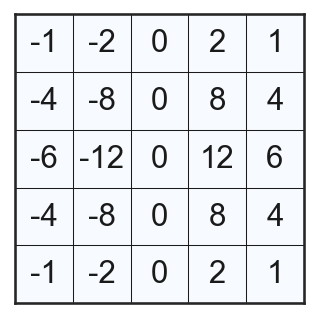

In [ ]:
m = cv2.getDerivKernels(1, 0, 5)
m = np.outer(m[0], m[1]).astype('int32').T
fig, ax = plt.subplots(figsize=(2.5, 2.5))
draw_frame(m, fig, ax)
plt.show()

OpenCV で Sobel フィルタを適用するには `cv2.Sobel`を用いる。この関数はグレースケールの画像を第 1 引数にとり、第 2 引数に画像の輝度値を表わす数値型 (8bit 符号なし整数なら`cv2.CV_8U`、32bit 浮動小数なら`cv2.CV_32F`)を与える。第 3 引数と第 4 引数は、勾配を取る方向と強さを表わしていて、`1, 0`の順で引数が与えられれば x 方向に強さ 1 で、`0, 1`の順で与えられれば y 方向に強さ 1 で勾配を取る。これに加えて`ksize=...`のパラメータに整数を指定することで、フィルタカーネルの大きさを指定する。

以下のコードでは、勾配が負の値となる箇所も検出するために、画像の型を 32bit 浮動小数に変換して計算している。

In [ ]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_gray = (img_gray / 255.0).astype('float32')
img_sobel_x = cv2.Sobel(img_gray, cv2.CV_32F, 1, 0, ksize=3)
img_sobel_y = cv2.Sobel(img_gray, cv2.CV_32F, 0, 1, ksize=3)

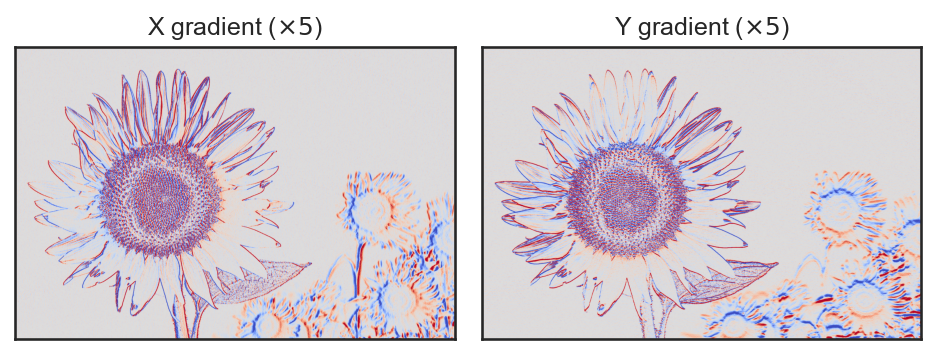

In [ ]:
fig, axs = plt.subplots(1, 2)

ax = axs[0]
ax.imshow(img_sobel_x * 5.0, cmap='coolwarm', vmin=-1.0, vmax=1.0)
ax.set(title='X gradient ($\\times 5$)', xticks=[], yticks=[])

ax = axs[1]
ax.imshow(img_sobel_y * 5.0, cmap='coolwarm', vmin=-1.0, vmax=1.0)
ax.set(title='Y gradient ($\\times 5$)', xticks=[], yticks=[])

plt.tight_layout()
plt.show()

上記の画像では正の勾配を赤色で、負の勾配を青色で表現している。結果から、Sobel フィルタによって、画像の x, y 各方向に対する勾配を元にしたエッジが求まっていることが確認できる。

実用上は x 方向の勾配の強さ$\nabla_x I$と y 方向の勾配の強さ$\nabla_y I$を区別する必要がない場合も多いので、そのような場合には、$\| \nabla I \|$のように勾配のノルムを取ってエッジ画像とすることもある。

In [ ]:
img_sobel = np.sqrt(img_sobel_x**2.0 + img_sobel_y**2.0)

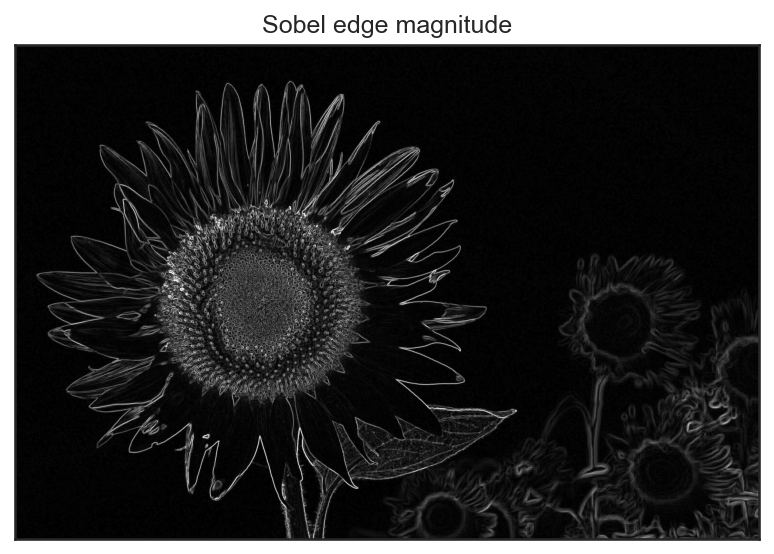

In [ ]:
fig, ax = plt.subplots()
ax.imshow(img_sobel, cmap='gray', vmin=0, vmax=1)
ax.set(title='Sobel edge magnitude', xticks=[], yticks=[])
plt.show()

#### Canny フィルタ

Sobel フィルタと並んで、よく用いられるエッジ検出フィルタに Canny フィルタがある。Sobel フィルタは、上記の結果を見ると分かる通り、「勾配がある場所」をエッジだと考えるが、エッジが物体の輪郭線であると考えると、その線幅は 1 ピクセル程度となっている方が尤もらしいとも考えられる。

Canny フィルタは Sobel フィルタの結果から、「物体の輪郭線としてのエッジ」をおよそ 1 ピクセル幅で検出するアルゴリズムである。

Canny フィルタは主につの処理からなる。

1. Sobel フィルタ (3x3 のフィルタカーネル)による勾配強度の計算
2. 勾配が極大となる画素の検出
3. ヒステリシス閾値処理

##### Sobel フィルタによる勾配強度の計算

まず、Sobel フィルタを用いて、x 方向の勾配と y 方向の勾配を計算する。これは先ほどと同様に x 方向と y 方向の各方向に対して Sobel フィルタを書けて、その勾配のノルムを取ることで実現する。なお、Canny フィルタの処理では、Sobel フィルタをかける前に一度 Gaussian フィルタによってノイズが低減される。

In [ ]:
img_ = img.astype('float32')

# ノイズの低減
img = cv2.GaussianBlur(img, (5, 5), sigmaX=1.0, sigmaY=1.0)

dx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
dy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)
grad = np.sqrt(np.sum(dx**2 + dy**2, axis=2))

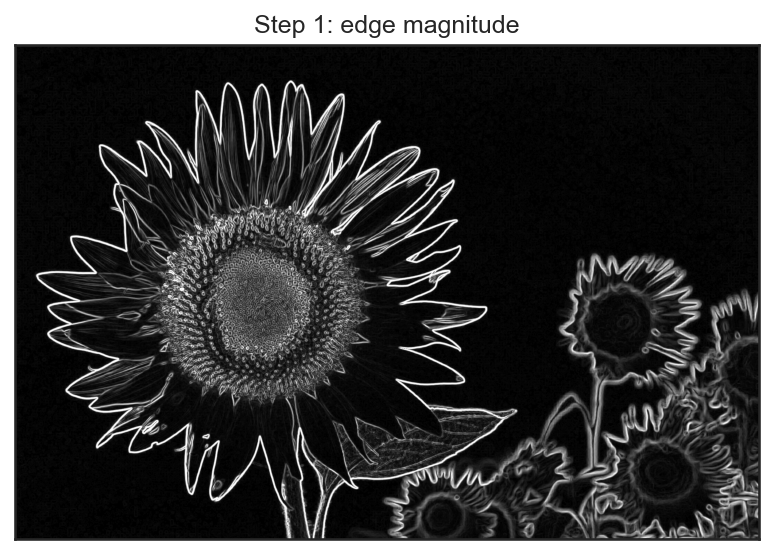

In [ ]:
fig, ax = plt.subplots()
ax.imshow(grad, cmap='gray', vmin=0, vmax=255)
ax.set(title='Step 1: edge magnitude', xticks=[], yticks=[])
plt.show()

##### 勾配が極大の画素の検出

次に、各画素について、勾配方向を計算し、その勾配方向に沿った方向に中心画素の輝度値が極大になっている画素だけを取り出す。

まずは、先ほどの x 方向勾配と y 方向勾配から、`arctan`を用いて勾配方向を計算する。その角度を、0°、45°、90°、135° のいずれかに分類する。今回は「向きを無視した方向」が分かれば良いので、`arctan`の戻り値が負の場合には$\pi$を足し算しておく。

In [ ]:
mag_dx = np.sqrt(np.sum(dx**2.0, axis=2))
mag_dy = np.sqrt(np.sum(dy**2.0, axis=2))

angle = np.arctan(mag_dy / (mag_dx + 1.0e-6))
angle = np.where(angle < 0.0, angle + np.pi, angle)
angle += np.pi / 8.0
angle = np.where(angle > np.pi, angle - np.pi, angle)
angle_type = (angle / (np.pi / 4.0)).astype('int32')
angle_type = np.clip(angle_type, 0, 3)  # 0: 0°, 1: 45°, 2: 90°, 3: 135°

その 3x3 の近傍画素をみて、中心の画素が最大の勾配を持っている画素だけを抜き出す。3x3 の近傍画素を取り出すために、以下では勾配画像の周囲に画素値 0 のマージンを 1 ピクセル幅で与え、その内部についてリスト内包表記によって各画素を中心とする 3x3 領域に対応する 9 画素を取り出している。

In [ ]:
lmax_grad = np.zeros_like(grad)
for y in range(grad.shape[0]):
    for x in range(grad.shape[1]):
        t = angle_type[y, x]
        v = grad[y, x]

        # 勾配方向に応じて調査する近傍画素を変更する
        x0, y0 = max(0, x - 1), max(0, y - 1)
        x1, y1 = min(x + 1, grad.shape[1] - 1), min(y + 1, grad.shape[0] - 1)
        if t == 0:
            # 0°の場合
            v0 = grad[y, x0]
            v1 = grad[y, x1]
        elif t == 1:
            # 45°の場合
            v0 = grad[y0, x0]
            v1 = grad[y1, x1]
        elif t == 2:
            # 90°の場合
            v0 = grad[y0, x]
            v1 = grad[y1, x]
        else:
            # 135°の場合
            v0 = grad[y0, x1]
            v1 = grad[y1, x0]

        # 近傍画素より勾配が大きければそれを残す
        if v >= max(v0, v1):
            lmax_grad[y, x] = v

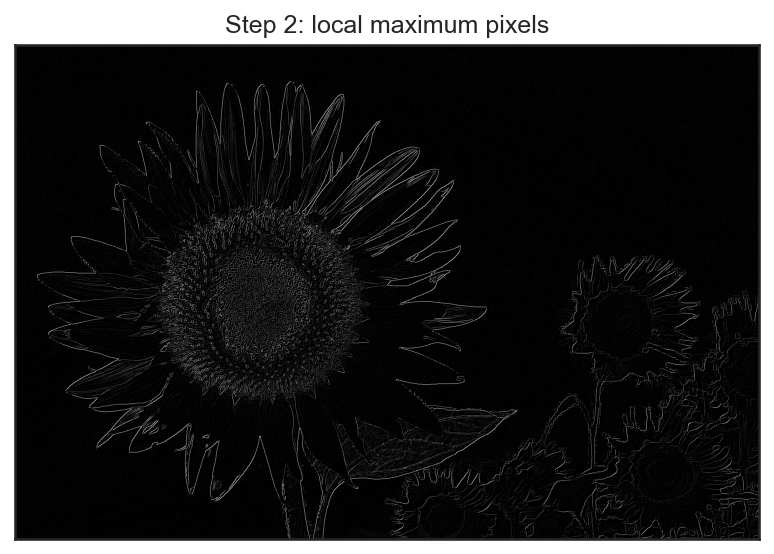

In [ ]:
fig, ax = plt.subplots()
ax.imshow(lmax_grad, cmap='gray', vmin=0, vmax=255)
ax.set(title='Step 2: local maximum pixels', xticks=[], yticks=[])
plt.show()

このように極大の部分だけを取り出すと、かなりエッジの線が細くなったことが分かる。

##### ヒステリシス閾値処理

ヒステリシスというのは、元々、とある状態から変化を加えていったときに、変化の過程と、元に戻る過程で異なる状態経路を取るような現象のことを指す。Canny フィルタで用いられる「ヒステリシス閾値処理」は、これに着想を得て、二段階の閾値処理をかける手法である。

ヒステリシス閾値処理には二種類の閾値 $\tau_1$と$\tau_2$を使用する (ただし$\tau_1 < \tau_2$)。もし上記の極大勾配の値が$\tau_2$を超えていたら、その画素は輪郭線であると見なす。また、反対に極大勾配の値が$\tau_1$を下回っていたら、その画素は輪郭線ではないと見なす。

最後に残った極大勾配が$[ \tau_1, \tau_2 ]$の区間に入る画素については、その周囲の 8 画素をみて、少なくとも 1 つの画素が$\tau_2$以上の極大勾配を持っているなら、その画素も輪郭線と見なす。

ここでは、画素値が$[0, 255]$の場合を基準として$\tau_1 = 50$, $\tau_2 = 100$としてヒステリシス閾値処理を実行する。なお、ここまでの処理では画像を 32bit 浮動小数で表わしているため、$\tau_1$と$\tau_2$はそのスケールに合うように大きさを調整する。

In [ ]:
from queue import Queue

tau_1 = 100
tau_2 = 200
edge1 = (lmax_grad > tau_1).astype('int32')  # エッジ候補
edge2 = (lmax_grad > tau_2).astype('int32')  # 確定エッジ

visited = np.zeros_like(edge1)
for y in range(grad.shape[0]):
    for x in range(grad.shape[1]):
        if edge2[y, x] == 1:
            # 幅優先探索で確定エッジの画素に接続したエッジ候補画素を洗い出す
            que = Queue()
            que.put((x, y))
            while not que.empty():
                qx, qy = que.get()
                if visited[qy, qx] != 0:
                    continue

                visited[qy, qx] = 1
                off_x = [-1, -1, -1, 0, 0, 0, 1, 1, 1]
                off_y = [-1, 0, 1, -1, 0, 1, -1, 0, 1]
                for ox, oy in zip(off_x, off_y):
                    nx = qx + ox
                    ny = qy + oy
                    if 0 <= nx < grad.shape[1] and 0 <= ny < grad.shape[0]:
                        if edge1[ny, nx] == 1 and edge2[ny, nx] == 0:
                            que.put((nx, ny))

img_canny = (visited * 255).astype('uint8')

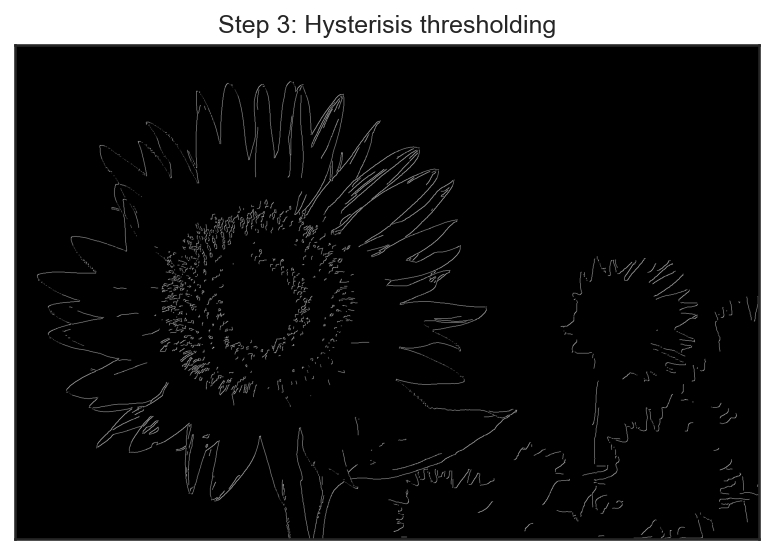

In [ ]:
fig, ax = plt.subplots()
ax.imshow(img_canny, cmap='gray')
ax.set(title='Step 3: Hysterisis thresholding', xticks=[], yticks=[])
plt.show()

OpenCV の`cv2.Canny`には上記と同様のコードが、以下のようなパラメータによって得られる。

In [ ]:
img_canny = cv2.Canny(img, 100, 200, apertureSize=3, L2gradient=True)

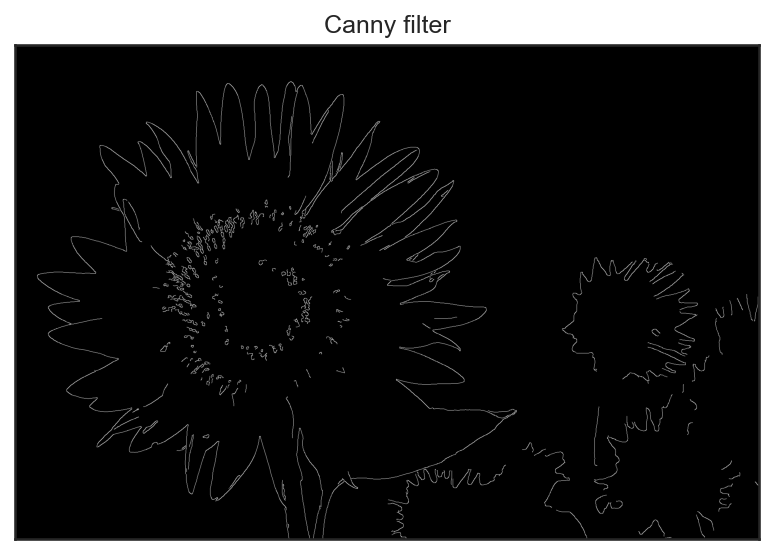

In [ ]:
fig, ax = plt.subplots()
ax.imshow(img_canny, cmap='gray')
ax.set(title='Canny filter', xticks=[], yticks=[])
plt.show()

二つの画像を比べてみると、概ね同じ画像が得られていることが分かる。

::::{admonition} 練習問題
:class: question

Gaussian フィルタは画像の高周波信号を取り除く「ローパスフィルタ」であると考えられる。フィルタカーネルの畳み込みの式をフーリエ変換することによって、この性質を調べよ。
::::

## 参考文献

:::{bibliography}
:filter: docname in docnames
:::